In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
import zipfile
import cv2 
from skimage import io 
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *  
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler, normalize
import os
import glob
import random
from google.colab import files #library to upload files to colab notebook
%matplotlib inline

In [2]:
# data containing path to Brain MRI and their corresponding mask
brain_df = pd.read_csv('/kaggle/input/healthcare-brain/Healthcare AI Datasets/Brain_MRI/data_mask.csv')

In [3]:
brain_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


In [4]:
brain_df.head(50)

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0
5,TCGA_CS_5395_19981004,TCGA_CS_5393_19990606/TCGA_CS_5393_19990606_1.tif,TCGA_CS_5393_19990606/TCGA_CS_5393_19990606_1_...,0
6,TCGA_CS_5395_19981004,TCGA_CS_4942_19970222/TCGA_CS_4942_19970222_1.tif,TCGA_CS_4942_19970222/TCGA_CS_4942_19970222_1_...,0
7,TCGA_CS_5395_19981004,TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_1.tif,TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_1_...,0
8,TCGA_CS_5395_19981004,TCGA_CS_6188_20010812/TCGA_CS_6188_20010812_1.tif,TCGA_CS_6188_20010812/TCGA_CS_6188_20010812_1_...,0
9,TCGA_CS_5395_19981004,TCGA_CS_6666_20011109/TCGA_CS_6666_20011109_1.tif,TCGA_CS_6666_20011109/TCGA_CS_6666_20011109_1_...,0


In [40]:
import os

# Define the base path
base_path = "./kaggle/input/healthcare-brain/Healthcare AI Datasets/Brain_MRI"

# Update the paths using lambda function
brain_df['image_path'] = brain_df['image_path'].apply(lambda x: os.path.join(base_path, x))
brain_df['mask_path'] = brain_df['mask_path'].apply(lambda x: os.path.join(base_path, x))

# Display the first few rows
brain_df.head()



,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0
1,TCGA_CS_5395_19981004,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0
2,TCGA_CS_5395_19981004,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0
3,TCGA_CS_5395_19981004,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0
4,TCGA_CS_5395_19981004,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0


In [41]:
brain_df.mask_path[1] # Path to the brain MRI image

'/kaggle/input/healthcare-brain/Healthcare AI Datasets/Brain_MRI/TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_mask.tif'

In [8]:
brain_df.image_path[1] # Path to the segmentation mask

'/kaggle/input/healthcare-brain/Healthcare AI Datasets/Brain_MRI/TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif'

In [9]:
brain_df

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0
1,TCGA_CS_5395_19981004,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0
2,TCGA_CS_5395_19981004,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0
3,TCGA_CS_5395_19981004,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0
4,TCGA_CS_5395_19981004,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0
...,...,...,...,...
3924,TCGA_DU_6401_19831001,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0
3925,TCGA_DU_6401_19831001,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0
3926,TCGA_DU_6401_19831001,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0
3927,TCGA_DU_6401_19831001,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0


In [10]:
brain_df['mask'].value_counts().index

Index([0, 1], dtype='int64', name='mask')

In [11]:
# Use plotly to plot interactive bar chart
import plotly.graph_objects as go

fig = go.Figure([go.Bar(x = brain_df['mask'].value_counts().index, y = brain_df['mask'].value_counts())])
fig.update_traces(marker_color = 'rgb(0,200,0)', marker_line_color = 'rgb(255,0,0)',
                  marker_line_width = 7, opacity = 0.5)
fig.show()

In [11]:
brain_df.mask_path

0       /kaggle/input/healthcare-brain/Healthcare AI D...
1       /kaggle/input/healthcare-brain/Healthcare AI D...
2       /kaggle/input/healthcare-brain/Healthcare AI D...
3       /kaggle/input/healthcare-brain/Healthcare AI D...
4       /kaggle/input/healthcare-brain/Healthcare AI D...
                              ...                        
3924    /kaggle/input/healthcare-brain/Healthcare AI D...
3925    /kaggle/input/healthcare-brain/Healthcare AI D...
3926    /kaggle/input/healthcare-brain/Healthcare AI D...
3927    /kaggle/input/healthcare-brain/Healthcare AI D...
3928    /kaggle/input/healthcare-brain/Healthcare AI D...
Name: mask_path, Length: 3929, dtype: object

In [12]:
brain_df.image_path

0       /kaggle/input/healthcare-brain/Healthcare AI D...
1       /kaggle/input/healthcare-brain/Healthcare AI D...
2       /kaggle/input/healthcare-brain/Healthcare AI D...
3       /kaggle/input/healthcare-brain/Healthcare AI D...
4       /kaggle/input/healthcare-brain/Healthcare AI D...
                              ...                        
3924    /kaggle/input/healthcare-brain/Healthcare AI D...
3925    /kaggle/input/healthcare-brain/Healthcare AI D...
3926    /kaggle/input/healthcare-brain/Healthcare AI D...
3927    /kaggle/input/healthcare-brain/Healthcare AI D...
3928    /kaggle/input/healthcare-brain/Healthcare AI D...
Name: image_path, Length: 3929, dtype: object

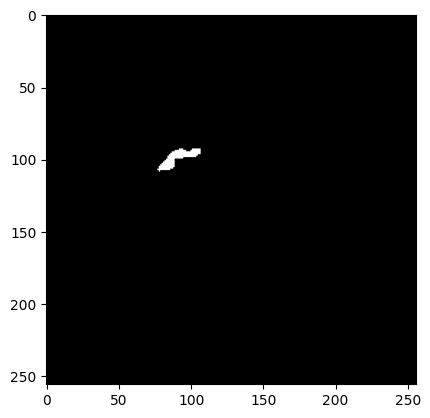

In [13]:
plt.imshow(cv2.imread(brain_df.mask_path[623]), 'gray')

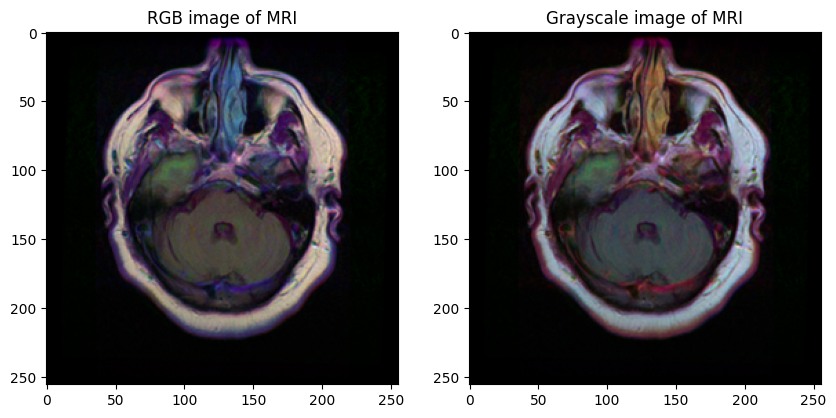

In [116]:
imgg = cv2.imread(brain_df.image_path[623])
rgbimg = cv2.cvtColor(imgg, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,6))

plt.subplot(1,2,1)
plt.imshow(rgbimg)
plt.title("RGB image of MRI")

plt.subplot(1,2,2)
plt.imshow(imgg)
plt.title("Grayscale image of MRI")
plt.show()

In [117]:
print(type(imgg))

<class 'numpy.ndarray'>


In [39]:
print(imgg)

[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


In [19]:
cv2.imread(brain_df.mask_path[623]).min()

0

In [20]:
cv2.imread(brain_df.mask_path[623]).max()

255

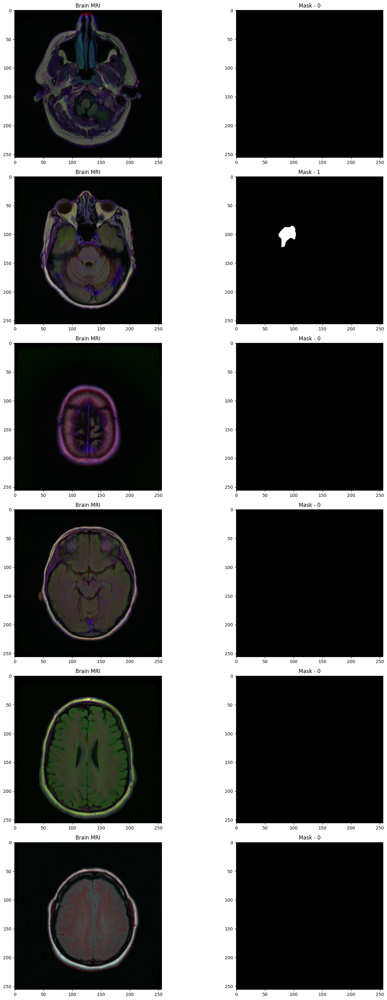

In [120]:
# Basic visualizations: Visualize the images (MRI and Mask) in the dataset separately
import random
fig, axs = plt.subplots(6,2, figsize=(16,32))
count = 0  
for x in range(6):
  i = random.randint(0, len(brain_df)) # select a random index
  axs[count][0].title.set_text("Brain MRI") # set title
  axs[count][0].imshow(cv2.cvtColor(cv2.imread(brain_df.image_path[i]), cv2.COLOR_BGR2RGB)) # show MRI
  axs[count][1].title.set_text("Mask - " + str(brain_df['mask'][i])) # plot title on the mask (0 or 1)
  axs[count][1].imshow(cv2.imread(brain_df.mask_path[i])) # Show corresponding mask
  count += 1

fig.tight_layout()

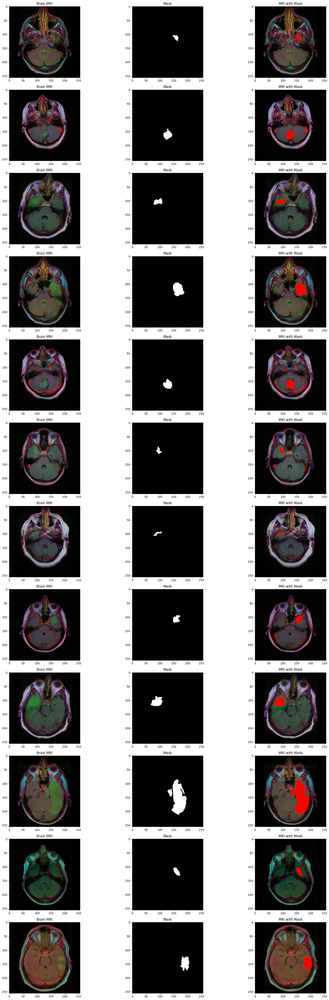

In [121]:
count = 0
fig, axs = plt.subplots(12, 3, figsize = (20, 50))
for i in range(len(brain_df)):
  if brain_df['mask'][i] ==1 and count <12:
    img = io.imread(brain_df.image_path[i])
    imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text('Brain MRI')
    axs[count][0].imshow(imgRGB)

    mask = io.imread(brain_df.mask_path[i])
    axs[count][1].title.set_text('Mask')
    axs[count][1].imshow(mask, cmap = 'gray')

     

    imgRGB[mask == 255] = (255, 0, 0)  #the position where mask holds 255, same position for img array.. would be 255, 0, 0
    axs[count][2].title.set_text('MRI with Mask')
    axs[count][2].imshow(imgRGB)
    count+=1

fig.tight_layout()


In [122]:
# Drop the patient id column
brain_df_train = brain_df.drop(columns = ['patient_id'])
brain_df_train.shape

(3929, 3)

In [123]:
# Convert the data in mask column to string format, to use categorical mode in flow_from_dataframe
# You will get this error message if you comment out the following code line:
# TypeError: If class_mode="categorical", y_col="mask" column values must be type string, list or tuple.
brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))

In [124]:
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [125]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size = 0.15)

In [126]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create a data generator which scales the data from 0 to 1 and makes validation split of 0.15
datagen = ImageDataGenerator(rescale=1./255., validation_split=0.15)


In [127]:
train_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="training",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))


valid_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="validation",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))

# Create a data generator for test images
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator=test_datagen.flow_from_dataframe(
dataframe=test,
directory= './',
x_col='image_path',
y_col='mask',
batch_size=16,
shuffle=False,
class_mode='categorical',
target_size=(256,256))



Found 2839 validated image filenames belonging to 2 classes.
Found 500 validated image filenames belonging to 2 classes.
Found 590 validated image filenames belonging to 2 classes.


In [34]:
# Get the ResNet50 base model
basemodel = ResNet50(weights = 'imagenet', include_top = False, input_tensor = Input(shape=(256, 256, 3)))

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [35]:
basemodel.summary() 

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 262, 262, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 128, 128, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 128, 128, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 128, 128, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 130, 130, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 64, 64, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 64, 64, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 64, 64, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 64, 64, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 64, 64, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 64, 64, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 64, 64, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [36]:
# freeze the model weights

for layer in basemodel.layers:
  layers.trainable = False

In [45]:
# Add top layers classification head to the base model

headmodel = basemodel.output
headmodel = AveragePooling2D(pool_size = (4,4))(headmodel)
headmodel = Flatten(name= 'flatten')(headmodel)
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)#
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)
#headmodel = Dense(256, activation = "relu")(headmodel)
#headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(2, activation = 'softmax')(headmodel)

model = Model(inputs = basemodel.input, outputs = headmodel)

In [46]:
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 262, 262, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 128, 128, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 128, 128, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 128, 128, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 130, 130, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 64, 64, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 64, 64, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 64, 64, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 64, 64, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 64, 64, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 64, 64, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 64, 64, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 25,751,426 (98.23 MB)

 Trainable params: 25,698,306 (98.03 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [50]:
# compile the model
optimizer = tf.keras.optimizers.AdamW(learning_rate=1e-4, weight_decay=1e-4)

model.compile(loss = 'categorical_crossentropy', optimizer=optimizer, metrics= ["accuracy"])

In [51]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Early stopping: Stops training if validation loss does not improve for 20 epochs
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# Save the best model (lowest validation loss) in the `.keras` format
checkpointer = ModelCheckpoint(filepath="classifier-resnet-weights.keras",
                               verbose=1,
                               save_best_only=True)


In [52]:
history = model.fit(train_generator, steps_per_epoch= train_generator.n // 16, epochs = 50, validation_data= valid_generator, validation_steps= valid_generator.n // 16, callbacks=[checkpointer, earlystopping])

Epoch 1/50
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - accuracy: 0.8736 - loss: 0.2893
Epoch 1: val_loss improved from inf to 0.55394, saving model to classifier-resnet-weights.keras
177/177 ━━━━━━━━━━━━━━━━━━━━ 99s 259ms/step - accuracy: 0.8736 - loss: 0.2892 - val_accuracy: 0.7857 - val_loss: 0.5539
Epoch 2/50
  1/177 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - accuracy: 0.8750 - loss: 0.1941
Epoch 2: val_loss did not improve from 0.55394
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8750 - loss: 0.1941 - val_accuracy: 0.7589 - val_loss: 0.5684
Epoch 3/50
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - accuracy: 0.8942 - loss: 0.2560
Epoch 3: val_loss improved from 0.55394 to 0.37853, saving model to classifier-resnet-weights.keras
177/177 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - accuracy: 0.8942 - loss: 0.2559 - val_accuracy: 0.8482 - val_loss: 0.3785
Epoch 4/50
  1/177 ━━━━━━━━━━━━━━━━━━━━ 19s 108ms/step - accuracy: 0.8750 - loss: 0.9907
Epoch 4: val_loss did not improve from 0.37853

In [81]:
 # Saves in TensorFlow's SavedModel format
model.save("brain-tumor.h5")  # Saves as a single HDF5 file
model.save_weights("my_model_weights.weights.h5")

# model.load_weights("my_model_weights.weights.h5")


In [58]:
# save the model architecture to json file for future use

model_json = model.to_json()
with open("classifier-resnet-model.json","w") as json_file:
  json_file.write(model_json) 

In [60]:
import tensorflow as tf


# Compile the model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [61]:
# make prediction

test_predict = model.predict(test_generator, steps = test_generator.n // 16, verbose =1)

36/36 ━━━━━━━━━━━━━━━━━━━━ 9s 174ms/step


In [62]:
test_predict.shape

(576, 2)

In [63]:
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc * 100:.2f}%")


37/37 ━━━━━━━━━━━━━━━━━━━━ 9s 116ms/step - accuracy: 0.9501 - loss: 0.2323
Test Accuracy: 95.42%


In [64]:
test_predict

array([[9.9861717e-01, 1.3828198e-03],
       [9.9999976e-01, 2.7999889e-07],
       [9.9998915e-01, 1.0820190e-05],
       ...,
       [1.6019692e-03, 9.9839801e-01],
       [2.4228165e-02, 9.7577184e-01],
       [9.9999702e-01, 3.0300248e-06]], dtype=float32)

In [66]:
# Obtain the predicted class from the model prediction
predict = []

for i in test_predict:
  predict.append(str(np.argmax(i)))

predict = np.asarray(predict)

In [67]:
predict

array(['0', '0', '0', '1', '0', '1', '0', '1', '0', '0', '0', '0', '0',
       '1', '0', '0', '0', '0', '0', '0', '1', '1', '0', '1', '1', '0',
       '0', '0', '0', '0', '0', '0', '1', '0', '0', '1', '0', '0', '0',
       '1', '0', '0', '0', '0', '0', '0', '1', '0', '0', '1', '0', '0',
       '1', '0', '0', '0', '0', '1', '1', '0', '0', '0', '0', '0', '0',
       '1', '1', '0', '0', '0', '0', '1', '0', '0', '1', '0', '0', '0',
       '0', '0', '1', '1', '0', '1', '0', '0', '0', '1', '1', '1', '0',
       '0', '1', '0', '1', '0', '0', '1', '0', '0', '0', '0', '0', '0',
       '1', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0',
       '1', '1', '1', '1', '1', '0', '1', '0', '0', '0', '0', '0', '0',
       '0', '1', '1', '0', '1', '0', '0', '0', '0', '1', '0', '0', '0',
       '0', '1', '0', '0', '0', '0', '1', '1', '0', '1', '0', '0', '0',
       '0', '1', '1', '0', '1', '0', '1', '0', '0', '1', '1', '0', '0',
       '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0', '0

In [68]:
# since we have used test generator, it limited the images to len(predict), due to batch size
original = np.asarray(test['mask'])[:len(predict)]
len(original)

576

In [69]:
# Obtain the accuracy of the model
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, predict)
accuracy

0.953125

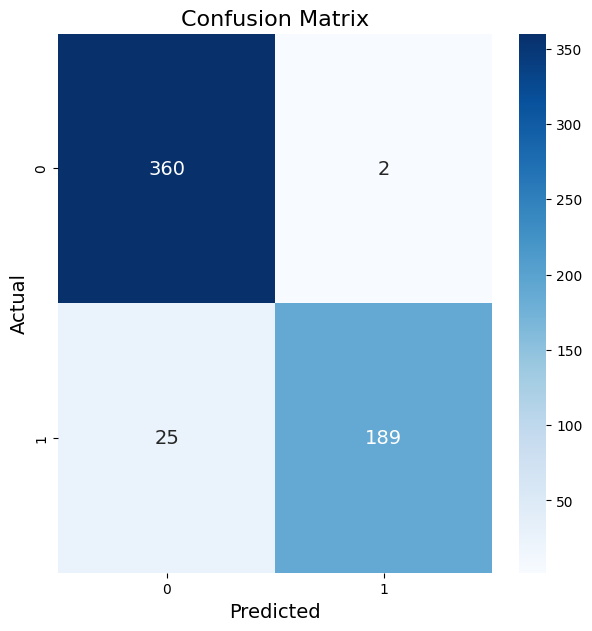

In [72]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Assuming 'original' is the true labels and 'predict' is the predicted labels
cm = confusion_matrix(original, predict)

# Set up the plot
plt.figure(figsize=(7,7))

# Create a heatmap with annotations
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=True, annot_kws={'size': 14})

# Add labels and title
plt.xlabel('Predicted', fontsize=14)
plt.ylabel('Actual', fontsize=14)
plt.title('Confusion Matrix', fontsize=16)

# Show the plot
plt.show() 


In [73]:
from sklearn.metrics import classification_report

report = classification_report(original, predict, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.94      0.99      0.96       362
           1       0.99      0.88      0.93       214

   micro avg       0.95      0.95      0.95       576
   macro avg       0.96      0.94      0.95       576
weighted avg       0.96      0.95      0.95       576



# **BUILDING A SEGMENTATION MODEL TO LOCALIZE TUMOR**

In [57]:
# Get the dataframe containing MRIs which have masks associated with them.
brain_df_mask = brain_df[brain_df['mask'] == 1]
brain_df_mask.shape 

(1373, 4)

In [58]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

X_train, X_val = train_test_split(brain_df_mask, test_size=0.15)
X_test, X_val = train_test_split(X_val, test_size=0.5)

In [59]:
X_train.image_path  

1184    /kaggle/input/healthcare-brain/Healthcare AI D...
2180    /kaggle/input/healthcare-brain/Healthcare AI D...
2702    /kaggle/input/healthcare-brain/Healthcare AI D...
2788    /kaggle/input/healthcare-brain/Healthcare AI D...
2461    /kaggle/input/healthcare-brain/Healthcare AI D...
                              ...                        
3646    /kaggle/input/healthcare-brain/Healthcare AI D...
1816    /kaggle/input/healthcare-brain/Healthcare AI D...
2411    /kaggle/input/healthcare-brain/Healthcare AI D...
1033    /kaggle/input/healthcare-brain/Healthcare AI D...
3806    /kaggle/input/healthcare-brain/Healthcare AI D...
Name: image_path, Length: 1167, dtype: object

In [60]:
# create separate list for imageId, classId to pass into the generator

train_ids = list(X_train.image_path) 
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask= list(X_val.mask_path)

In [114]:
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras import backend as K
from skimage import io

# Custom Data Generator
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, ids, mask, image_dir='./', batch_size=16, img_h=256, img_w=256, shuffle=True):
        self.ids = ids
        self.mask = mask
        self.image_dir = image_dir
        self.batch_size = batch_size
        self.img_h = img_h
        self.img_w = img_w
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return int(np.floor(len(self.ids) / self.batch_size))

    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size: (index + 1) * self.batch_size]
        list_ids = [self.ids[i] for i in indexes]
        list_mask = [self.mask[i] for i in indexes]
        X, y = self.__data_generation(list_ids, list_mask)
        return X, y

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.ids))
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_ids, list_mask):
        X = np.empty((self.batch_size, self.img_h, self.img_w, 3))
        y = np.empty((self.batch_size, self.img_h, self.img_w, 1))

        for i in range(len(list_ids)):
            img_path = list_ids[i]
            mask_path = list_mask[i]

            img = io.imread(img_path)
            mask = io.imread(mask_path)

            img = cv2.resize(img, (self.img_h, self.img_w))
            mask = cv2.resize(mask, (self.img_h, self.img_w))

            img = np.array(img, dtype=np.float32) / 255.0  # Normalize
            mask = np.array(mask, dtype=np.float32) / 255.0

            X[i] = img
            y[i] = np.expand_dims(mask, axis=-1)

        y = (y > 0).astype(int)  # Convert mask to binary
        return X, y


# Custom Loss Functions
def tversky(y_true, y_pred, smooth=1e-6):
    y_true = K.cast(y_true, dtype="float32")  # Ensure same dtype
    y_pred = K.cast(y_pred, dtype="float32")
    
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1 - y_pred_pos))
    false_pos = K.sum((1 - y_true_pos) * y_pred_pos)
    
    alpha = 0.7
    return (true_pos + smooth) / (true_pos + alpha * false_neg + (1 - alpha) * false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true, y_pred)

def focal_tversky(y_true, y_pred):
    gamma = 0.75
    return K.pow((1 - tversky(y_true, y_pred)), gamma)

import tensorflow.keras.backend as K

def dice_coefficient(y_true, y_pred, smooth=1):
    # Flatten the inputs and cast them to the same type (float32)
    y_true_f = K.cast(K.flatten(y_true), 'float32')
    y_pred_f = K.cast(K.flatten(y_pred), 'float32')
    
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


In [85]:


# Create image generators
training_generator = DataGenerator(train_ids, train_mask)
validation_generator = DataGenerator(val_ids, val_mask)


In [10]:
# import sys
# # Add the directory containing utilities.py to the Python path
# sys.path.append('/kaggle/input/healthcare-brain/Healthcare AI Datasets/Brain_MRI')  # Replace 'scripts' with your actual directory path

# # Now import the DataGenerator from the utilities module
# from utilities import DataGenerator

# # create image generators

# training_generator = DataGenerator(train_ids,train_mask)
# validation_generator = DataGenerator(val_ids,val_mask)

In [86]:
def resblock(X, f):


  # make a copy of input
  X_copy = X

  # main path
  # Read more about he_normal: https://medium.com/@prateekvishnu/xavier-and-he-normal-he-et-al-initialization-8e3d7a087528

  X = Conv2D(f, kernel_size = (1,1) ,strides = (1,1),kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)
  X = Activation('relu')(X)

  X = Conv2D(f, kernel_size = (3,3), strides =(1,1), padding = 'same', kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)

  # Short path
  # Read more here: https://towardsdatascience.com/understanding-and-coding-a-resnet-in-keras-446d7ff84d33

  X_copy = Conv2D(f, kernel_size = (1,1), strides =(1,1), kernel_initializer ='he_normal')(X_copy)
  X_copy = BatchNormalization()(X_copy)

  # Adding the output from main path and short path together

  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  return X

In [87]:
# function to upscale and concatenate the values passsed
def upsample_concat(x, skip):
  x = UpSampling2D((2,2))(x)
  merge = Concatenate()([x, skip])

  return merge

In [88]:
input_shape = (256,256,3)

# Input tensor shape
X_input = Input(input_shape)

# Stage 1
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 = MaxPool2D(pool_size = (2,2))(conv1_in)

# Stage 2
conv2_in = resblock(pool_1, 32)
pool_2 = MaxPool2D(pool_size = (2,2))(conv2_in)

# Stage 3
conv3_in = resblock(pool_2, 64)
pool_3 = MaxPool2D(pool_size = (2,2))(conv3_in)

# Stage 4
conv4_in = resblock(pool_3, 128)
pool_4 = MaxPool2D(pool_size = (2,2))(conv4_in)

# Stage 5 (Bottle Neck)
conv5_in = resblock(pool_4, 256)

# Upscale stage 1
up_1 = upsample_concat(conv5_in, conv4_in)
up_1 = resblock(up_1, 128)

# Upscale stage 2
up_2 = upsample_concat(up_1, conv3_in)
up_2 = resblock(up_2, 64)

# Upscale stage 3
up_3 = upsample_concat(up_2, conv2_in)
up_3 = resblock(up_3, 32)

# Upscale stage 4
up_4 = upsample_concat(up_3, conv1_in)
up_4 = resblock(up_4, 16)

# Final Output
output = Conv2D(1, (1,1), padding = "same", activation = "sigmoid")(up_4)

model_seg = Model(inputs = X_input, outputs = output )


In [89]:
model_seg.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_108 (Conv2D)       │ (None, 256, 256, 16)   │            448 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_104   │ (None, 256, 256, 16)   │             64 │ conv2d_108[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_109 (Conv2D)       │ (None, 256, 256, 16)   │          2,320 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_105   │ (None, 256, 256, 16)   │             64 │ conv2d_109[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_16          │ (None, 128, 128, 16)   │              0 │ batch_normalization_1… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_110 (Conv2D)       │ (None, 128, 128, 32)   │            544 │ max_pooling2d_16[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_106   │ (None, 128, 128, 32)   │            128 │ conv2d_110[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_64             │ (None, 128, 128, 32)   │              0 │ batch_normalization_1… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_111 (Conv2D)       │ (None, 128, 128, 32)   │          9,248 │ activation_64[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_112 (Conv2D)       │ (None, 128, 128, 32)   │            544 │ max_pooling2d_16[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_107   │ (None, 128, 128, 32)   │            128 │ conv2d_111[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_108   │ (None, 128, 128, 32)   │            128 │ conv2d_112[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_32 (Add)              │ (None, 128, 128, 32)   │              0 │ batch_normalization_1… │
│                           │                        │                │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_65             │ (None, 128, 128, 32)   │              0 │ add_32[0][0]           │
│ (Activation)         

 Total params: 1,210,513 (4.62 MB)

 Trainable params: 1,206,129 (4.60 MB)

 Non-trainable params: 4,384 (17.12 KB)

In [17]:
# # Utilities file contains the code for custom loss function and custom data generator

# from utilities import focal_tversky, tversky_loss, tversky

In [38]:
# from tensorflow.keras.losses import BinaryCrossentropy, CategoricalCrossentropy


In [95]:

# Compile the model
adam = tf.keras.optimizers.Adam(learning_rate = 0.0001, epsilon = 0.1)
model_seg.compile(optimizer='adam', loss= focal_tversky, metrics=['accuracy', tversky, dice_coefficient])



In [96]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="ResUNet-weights.keras", verbose=1, save_best_only=True)

In [97]:
history = model_seg.fit(training_generator, epochs = 50, validation_data = validation_generator, callbacks = [checkpointer, earlystopping])

Epoch 1/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9962 - dice_coefficient: 0.9331 - loss: 0.1094 - tversky: 0.9473
Epoch 1: val_loss improved from inf to 0.17759, saving model to ResUNet-weights.keras
72/72 ━━━━━━━━━━━━━━━━━━━━ 37s 173ms/step - accuracy: 0.9962 - dice_coefficient: 0.9332 - loss: 0.1093 - tversky: 0.9473 - val_accuracy: 0.9927 - val_dice_coefficient: 0.8862 - val_loss: 0.1776 - val_tversky: 0.8999
Epoch 2/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9969 - dice_coefficient: 0.9471 - loss: 0.0900 - tversky: 0.9595
Epoch 2: val_loss improved from 0.17759 to 0.17191, saving model to ResUNet-weights.keras
72/72 ━━━━━━━━━━━━━━━━━━━━ 8s 103ms/step - accuracy: 0.9969 - dice_coefficient: 0.9471 - loss: 0.0900 - tversky: 0.9595 - val_accuracy: 0.9937 - val_dice_coefficient: 0.8982 - val_loss: 0.1719 - val_tversky: 0.9039
Epoch 3/50
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.9971 - dice_coefficient: 0.9507 - loss: 0.0851 - tversky: 0.9624
Ep

In [102]:
model_seg.save("model_seg.h5")


In [105]:
model_seg.save_weights("model_seg_weights.weights.h5")


In [99]:
print(history.history.keys())


dict_keys(['accuracy', 'dice_coefficient', 'loss', 'tversky', 'val_accuracy', 'val_dice_coefficient', 'val_loss', 'val_tversky'])


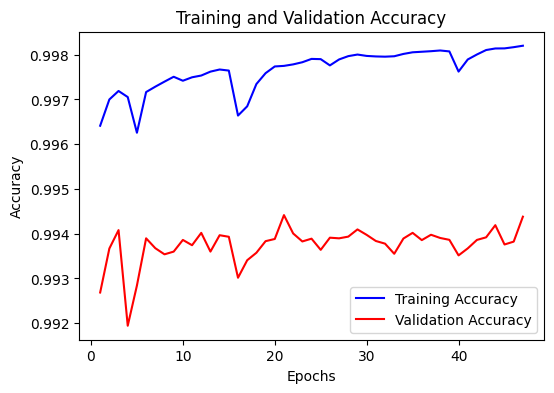

In [110]:
import matplotlib.pyplot as plt

def plot_accuracy(history):
    epochs = range(1, len(history.history['accuracy']) + 1)
    
    plt.figure(figsize=(6, 4))
    plt.plot(epochs, history.history['accuracy'], 'b', label='Training Accuracy')
    plt.plot(epochs, history.history['val_accuracy'], 'r', label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.show()



plot_accuracy(history)

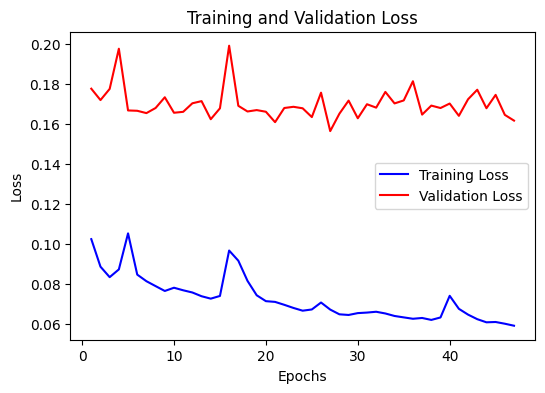

In [111]:
def plot_loss(history):
    epochs = range(1, len(history.history['loss']) + 1)
    
    plt.figure(figsize=(6, 4))
    plt.plot(epochs, history.history['loss'], 'b', label='Training Loss')
    plt.plot(epochs, history.history['val_loss'], 'r', label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()


plot_loss(history)

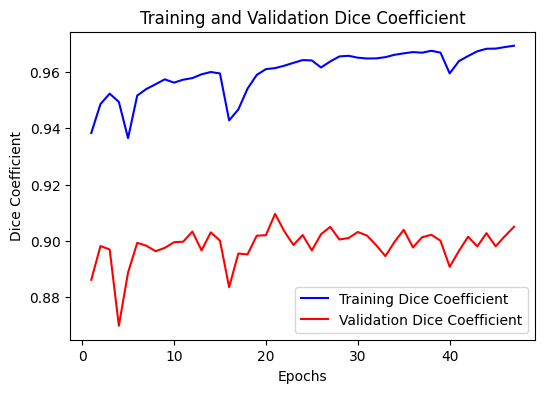

In [112]:
def plot_dice_coefficient(history):
    epochs = range(1, len(history.history['dice_coefficient']) + 1)
    
    plt.figure(figsize=(6, 4))
    plt.plot(epochs, history.history['dice_coefficient'], 'b', label='Training Dice Coefficient')
    plt.plot(epochs, history.history['val_dice_coefficient'], 'r', label='Validation Dice Coefficient')
    plt.xlabel('Epochs')
    plt.ylabel('Dice Coefficient')
    plt.title('Training and Validation Dice Coefficient')
    plt.legend()
    plt.show()


plot_dice_coefficient(history)

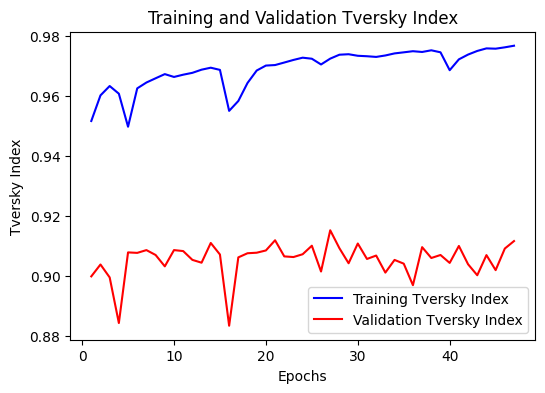

In [113]:
def plot_tversky(history):
    epochs = range(1, len(history.history['tversky']) + 1)
    
    plt.figure(figsize=(6, 4))
    plt.plot(epochs, history.history['tversky'], 'b', label='Training Tversky Index')
    plt.plot(epochs, history.history['val_tversky'], 'r', label='Validation Tversky Index')
    plt.xlabel('Epochs')
    plt.ylabel('Tversky Index')
    plt.title('Training and Validation Tversky Index')
    plt.legend()
    plt.show()


plot_tversky(history)

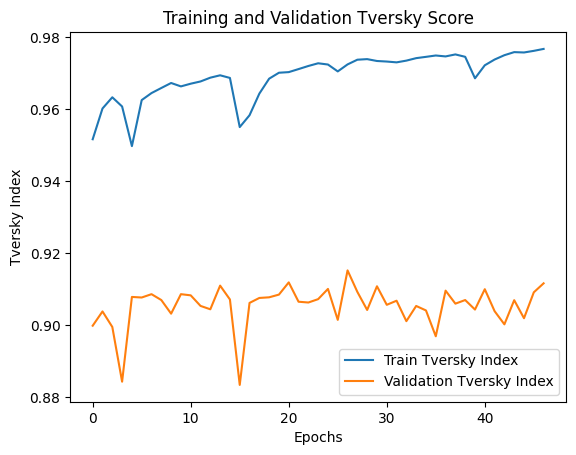

In [100]:
import matplotlib.pyplot as plt

# Plot Tversky index (higher is better)
plt.plot(history.history['tversky'], label='Train Tversky Index')
plt.plot(history.history['val_tversky'], label='Validation Tversky Index')

plt.xlabel('Epochs')
plt.ylabel('Tversky Index')
plt.legend()
plt.title('Training and Validation Tversky Score')
plt.show()


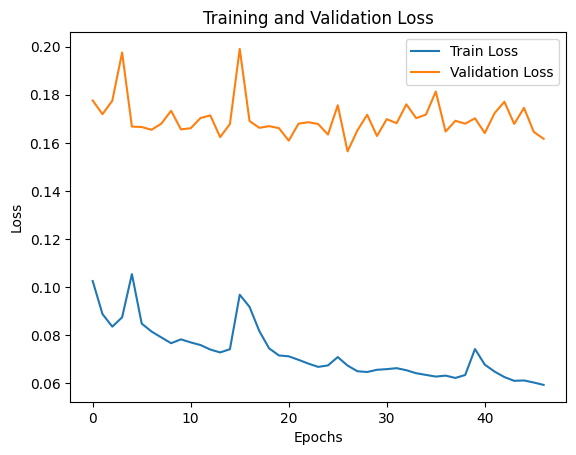

In [101]:
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()


In [128]:
from tensorflow.keras.models import load_model

# Load the model
model = load_model("/kaggle/input/brain-tumor-classification-model/brain-tumor.h5")



In [129]:
# compile the model
optimizer = tf.keras.optimizers.AdamW(learning_rate=1e-4, weight_decay=1e-4)

model.compile(loss = 'categorical_crossentropy', optimizer=optimizer, metrics= ["accuracy"])

In [132]:
import os
import numpy as np
import cv2
from skimage import io
from tensorflow.keras.models import load_model

def prediction(test, model, model_seg):
    directory = '/kaggle/input/healthcare-brain/Healthcare AI Datasets/Brain_MRI/'
    mask, image_id, has_mask = [], [], []

    for i in test.image_path:
        path = os.path.join(directory, str(i))
        if not os.path.exists(path):
            continue

        # Read and preprocess image once
        img = io.imread(path)
        img_resized = cv2.resize(img, (256, 256)).astype(np.float64)

        # Classification: Detect tumor presence
        img_class = img_resized / 255.0  # Normalize for classification model
        img_class = np.reshape(img_class, (1, 256, 256, 3))
        is_defect = model.predict(img_class)

        if np.argmax(is_defect) == 0:  # No tumor detected
            image_id.append(i)
            has_mask.append(0)
            mask.append('No mask')
            continue

        # Segmentation Model Prediction
        img_seg = (img_resized - img_resized.mean()) / img_resized.std()  # Normalize for segmentation
        img_seg = np.reshape(img_seg, (1, 256, 256, 3))
        predict = model_seg.predict(img_seg)

        # Apply threshold to determine if mask exists
        if np.any(predict > 0.5):  # Threshold applied
            image_id.append(i)
            has_mask.append(1)
            mask.append(predict)
        else:
            image_id.append(i)
            has_mask.append(0)
            mask.append('No mask')

    return image_id, mask, has_mask



# Making predictions
image_id, mask, has_mask = prediction(test, model, model_seg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━

In [133]:
# creating a dataframe for the result
df_pred = pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})
df_pred

,image_path,predicted_mask,has_mask
0,/kaggle/input/healthcare-brain/Healthcare AI D...,No mask,0
1,/kaggle/input/healthcare-brain/Healthcare AI D...,No mask,0
2,/kaggle/input/healthcare-brain/Healthcare AI D...,No mask,0
3,/kaggle/input/healthcare-brain/Healthcare AI D...,No mask,0
4,/kaggle/input/healthcare-brain/Healthcare AI D...,"[[[[0.24089967], [0.8962015], [1.], [1.], [1.]...",1
...,...,...,...
585,/kaggle/input/healthcare-brain/Healthcare AI D...,"[[[[0.09173634], [0.7998278], [1.], [1.], [1.]...",1
586,/kaggle/input/healthcare-brain/Healthcare AI D...,No mask,0
587,/kaggle/input/healthcare-brain/Healthcare AI D...,"[[[[0.18183759], [0.87603235], [1.], [1.], [1....",1
588,/kaggle/input/healthcare-brain/Healthcare AI D...,"[[[[0.02189796], [0.9694278], [1.], [1.], [1.]...",1


In [135]:
# Merge the dataframe containing predicted results with the original test data.
df_pred = test.merge(df_pred, on = 'image_path')
df_pred.head() 

,image_path,mask_path,mask,predicted_mask,has_mask
0,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0,No mask,0
1,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0,No mask,0
2,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0,No mask,0
3,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,0,No mask,0
4,/kaggle/input/healthcare-brain/Healthcare AI D...,/kaggle/input/healthcare-brain/Healthcare AI D...,1,"[[[[0.24089967], [0.8962015], [1.], [1.], [1.]...",1


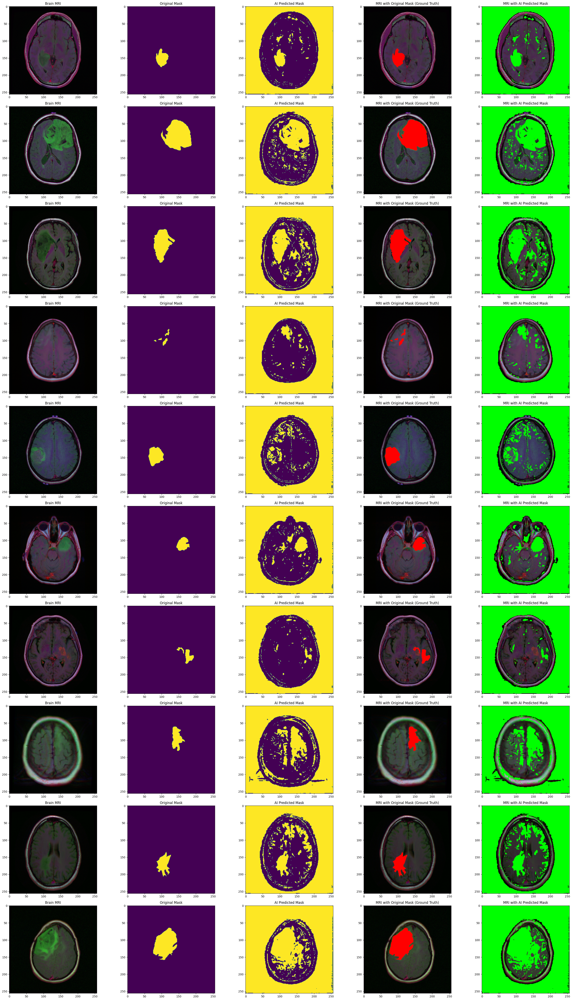

In [138]:
count = 0
fig, axs = plt.subplots(10, 5, figsize=(30, 50))
for i in range(len(df_pred)):
  if df_pred['has_mask'][i] == 1 and count < 10:
    # read the images and convert them to RGB format
    img = io.imread(df_pred.image_path[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # Obtain the mask for the image
    mask = io.imread(df_pred.mask_path[i])
    axs[count][1].title.set_text("Original Mask")
    axs[count][1].imshow(mask)

    # Obtain the predicted mask for the image
    predicted_mask = np.asarray(df_pred.predicted_mask[i])[0].squeeze().round()
    axs[count][2].title.set_text("AI Predicted Mask")
    axs[count][2].imshow(predicted_mask)

    # Apply the mask to the image 'mask==255'
    img[mask == 255] = (255, 0, 0)
    axs[count][3].title.set_text("MRI with Original Mask (Ground Truth)")
    axs[count][3].imshow(img)

    img_ = io.imread(df_pred.image_path[i])
    img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    img_[predicted_mask == 1] = (0, 255, 0)
    axs[count][4].title.set_text("MRI with AI Predicted Mask")
    axs[count][4].imshow(img_)
    count += 1

fig.tight_layout()